[Unsupervised Domain Adaptation by Backpropagation](http://proceedings.mlr.press/v37/ganin15.pdf)  

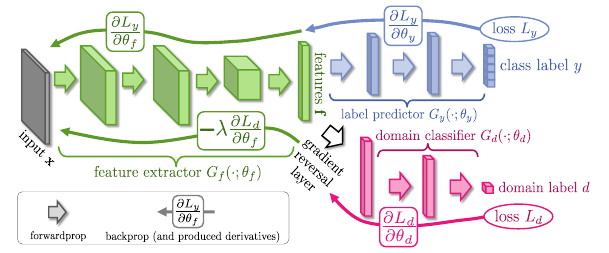

### Libraries 📚⬇

In [1]:
import numpy as np
import pandas as pd
from PIL import Image
from pathlib import Path
import random, math, cv2
from tqdm import tqdm_notebook as tqdm
# from tqdm import tqdm

import torch
from torch import nn
import torch.nn.functional as F
from torch.autograd import Function
from torchvision.datasets import MNIST
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms
from torchvision.transforms import Compose, ToTensor

import matplotlib.pyplot as plt
import plotly
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

In [4]:
MNIST_DATA_DIR = Path('./')
BSDS_DATA_DIR = Path('./bsds500')
MODEL_FILE = Path('./best_source_weights_mnist.pth')

batch_size = 64
epochs = 15

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [5]:
def visualize_digits(dataset, k=80, mnistm=False, cmap=None, title=None):
    
    ncols = 20
    indices = random.choices(range(len(dataset)), k=k)
    nrows = math.floor(len(indices)/ncols)
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols,nrows+0.4), gridspec_kw=dict(wspace=0.1, hspace=0.1), subplot_kw=dict(yticks=[], xticks=[]))
    axes_flat = axes.reshape(-1)
    fig.suptitle(title, fontsize=20)
    
    for list_idx, image_idx in enumerate(indices[:ncols*nrows]):
        ax = axes_flat[list_idx]
        image = dataset[image_idx][0]
        image = image.numpy().transpose(1, 2, 0)
        ax.imshow(image, cmap=cmap)

def set_requires_grad(model, requires_grad=True):
    for param in model.parameters():
        param.requires_grad = requires_grad

class GrayscaleToRgb:
    """Convert a grayscale image to rgb"""
    def __call__(self, image):
        image = np.array(image)
        image = np.dstack([image, image, image])
        return Image.fromarray(image)

### Define Model

In [6]:
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.feature_extractor = nn.Sequential(
            nn.Conv2d(3, 10, kernel_size=5),
            nn.MaxPool2d(2),
            nn.ReLU(),
            nn.Conv2d(10, 20, kernel_size=5),
            nn.MaxPool2d(2),
            nn.Dropout2d(),
        )
        
        self.classifier = nn.Sequential(
            nn.Linear(320, 50),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(50, 10),
            nn.LogSoftmax(),
        )

    def forward(self, x):
        features = self.feature_extractor(x)
        features = features.view(x.shape[0], -1)
        logits = self.classifier(features)
        return logits

In [7]:
class GradientReversalFunction(Function):
    """
    Gradient Reversal Layer from:
    Unsupervised Domain Adaptation by Backpropagation (Ganin & Lempitsky, 2015)
    Forward pass is the identity function. In the backward pass,
    the upstream gradients are multiplied by -lambda (i.e. gradient is reversed)
    """

    @staticmethod
    def forward(ctx, x, lambda_):
        ctx.lambda_ = lambda_
        return x.clone()

    @staticmethod
    def backward(ctx, grads):
        lambda_ = ctx.lambda_
        lambda_ = grads.new_tensor(lambda_)
        dx = -lambda_ * grads
        return dx, None


class GradientReversal(torch.nn.Module):
    def __init__(self, lambda_=1):
        super(GradientReversal, self).__init__()
        self.lambda_ = lambda_

    def forward(self, x):
        return GradientReversalFunction.apply(x, self.lambda_)

In [8]:
model = Net().to(device)
model.load_state_dict(torch.load(MODEL_FILE, map_location=device))
feature_extractor = model.feature_extractor
clf = model.classifier

discriminator = nn.Sequential(
    GradientReversal(),
    nn.Linear(320, 50),
    nn.ReLU(),
    nn.Linear(50, 20),
    nn.ReLU(),
    nn.Linear(20, 1)
).to(device)

### Define Dataset Classes

In [9]:
class BSDS500(Dataset):

    def __init__(self):
        image_folder = BSDS_DATA_DIR / 'images'
        self.image_files = list(map(str, image_folder.glob('*/*.jpg')))

    def __getitem__(self, i):
        image = cv2.imread(self.image_files[i], cv2.IMREAD_COLOR)
        tensor = torch.from_numpy(image.transpose(2, 0, 1))
        return tensor

    def __len__(self):
        return len(self.image_files)


class MNISTM(Dataset):

    def __init__(self, train=True):
        super(MNISTM, self).__init__()
        self.mnist = datasets.MNIST(MNIST_DATA_DIR / 'mnist', train=train,
                                    download=True)
        self.bsds = BSDS500()
        # Fix RNG so the same images are used for blending
        self.rng = np.random.RandomState(42)

    def __getitem__(self, i):
        digit, label = self.mnist[i]
        digit = transforms.ToTensor()(digit)
        bsds_image = self._random_bsds_image()
        patch = self._random_patch(bsds_image)
        patch = patch.float() / 255
        blend = torch.abs(patch - digit)
        return blend, label

    def _random_patch(self, image, size=(28, 28)):
        _, im_height, im_width = image.shape
        x = self.rng.randint(0, im_width-size[1])
        y = self.rng.randint(0, im_height-size[0])
        return image[:, y:y+size[0], x:x+size[1]]

    def _random_bsds_image(self):
        i = self.rng.choice(len(self.bsds))
        return self.bsds[i]

    def __len__(self):
        return len(self.mnist)

### Get Datasets & Dataloaders

In [10]:
half_batch = batch_size // 2
source_dataset = MNIST(MNIST_DATA_DIR/'mnist', train=True, download=True, transform=Compose([GrayscaleToRgb(), ToTensor()]))
source_loader = DataLoader(source_dataset, batch_size=half_batch, shuffle=True, num_workers=1, pin_memory=True)

target_train_dataset, target_test_dataset = MNISTM(train=True), MNISTM(train=False)
target_train_loader = DataLoader(target_train_dataset, batch_size=half_batch, shuffle=True, num_workers=16, pin_memory=True)
target_test_loader = DataLoader(target_test_dataset, batch_size=batch_size, shuffle=True, num_workers=16, pin_memory=True)

optim = torch.optim.Adam(list(discriminator.parameters()) + list(model.parameters()))

### Visualize MNIST-M & MNIST Data 🖼️

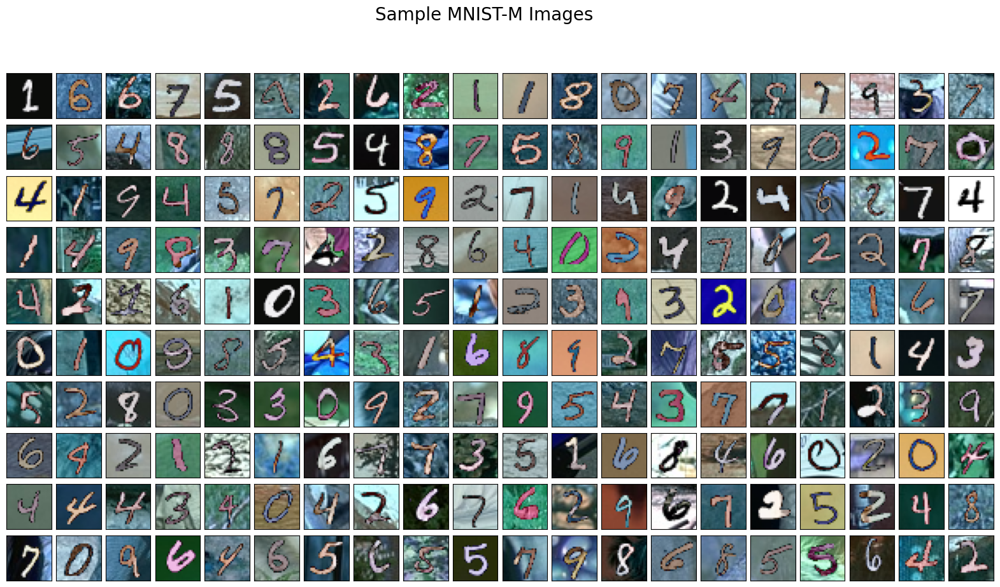

In [11]:
visualize_digits(dataset=target_train_dataset, k=200, mnistm=True, title='Sample MNIST-M Images')

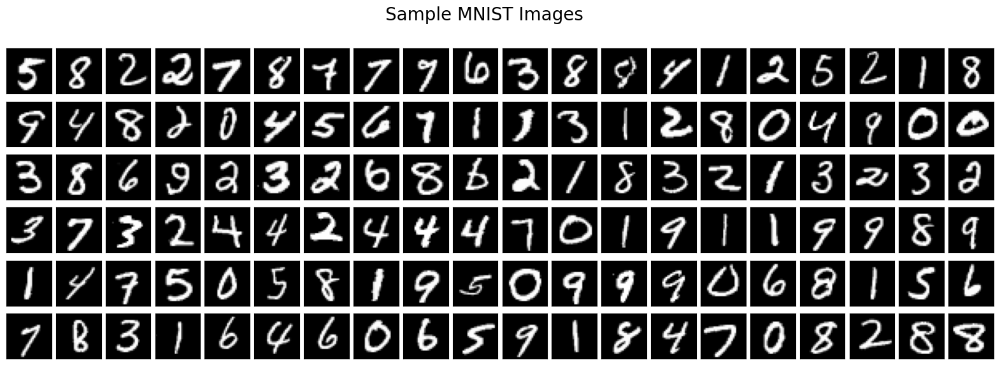

In [12]:
visualize_digits(dataset=source_dataset, k=120, cmap='gray', title='Sample MNIST Images')

### Unsupervised Domain Adaptation by Backpropagation

In [13]:
domain_losses, domain_accuracies, domain_train_counter = [], [], []
label_losses, label_accuracies = [], []
test_losses, test_accuracies = [], []
test_counter = [idx*len(target_train_loader.dataset) for idx in range(0, epochs+1)]

In [14]:
# Initial Testing
test_loss = test_accuracy = 0
model.feature_extractor = feature_extractor
model.classifier = clf
model.eval()
tqdm_bar = tqdm(target_test_loader, desc=f'Testing ', total=int(len(target_test_loader)))
for batch_idx, (images, labels) in enumerate(tqdm_bar):
    images, labels = images.to(device), labels.to(device)
    with torch.no_grad():
        outputs = model(images)
        loss = F.cross_entropy(outputs, labels)
    test_loss += loss.item()
    test_accuracy = (outputs.max(1)[1] == labels).float().mean().item()
    tqdm_bar.set_postfix(test_loss=(test_loss/(batch_idx+1)), test_accuracy=test_accuracy/(batch_idx+1))
test_losses.append(test_loss/len(target_test_loader))
test_accuracies.append(test_accuracy/len(target_test_loader))


Testing :   0%|          | 0/157 [00:00<?, ?it/s]

In [15]:
for epoch in range(epochs):
    batches = zip(source_loader, target_train_loader)
    n_batches = min(len(source_loader), len(target_train_loader))

    total_domain_loss = total_domain_accuracy = 0
    total_label_loss = total_label_accuracy = 0
    tqdm_bar = tqdm(batches, desc=f'Training Epoch {epoch} ', total=n_batches)
    for batch_idx, ((source_x, source_labels), (target_x, _)) in enumerate(tqdm_bar):
        x = torch.cat([source_x, target_x])
        x = x.to(device)
        domain_y = torch.cat([torch.ones(source_x.shape[0]), torch.zeros(target_x.shape[0])])
        domain_y = domain_y.to(device)
        label_y = source_labels.to(device)

        features = feature_extractor(x).view(x.shape[0], -1)
        domain_preds = discriminator(features).squeeze()
        label_preds = clf(features[:source_x.shape[0]])

        domain_loss = F.binary_cross_entropy_with_logits(domain_preds, domain_y)
        label_loss = F.cross_entropy(label_preds, label_y)
        loss = domain_loss + label_loss

        optim.zero_grad()
        loss.backward()
        optim.step()

        total_domain_loss += domain_loss.item()
        domain_losses.append(domain_loss.item())
        domain_accuracy = ((domain_preds > 0).long() == domain_y.long()).float().mean().item()
        total_domain_accuracy += domain_accuracy
        domain_accuracies.append(domain_accuracy)
        
        total_label_loss += label_loss.item()
        label_losses.append(label_loss.item())
        label_accuracy = (label_preds.max(1)[1] == label_y).float().mean().item()
        total_label_accuracy += label_accuracy
        label_accuracies.append(label_accuracy)
        domain_train_counter.append(batch_idx*batch_size + source_x.size(0) + target_x.size(0) + epoch*min(len(target_train_dataset),len(source_dataset)))
        tqdm_bar.set_postfix(domain_loss=(total_domain_loss/(batch_idx+1)), domain_accuracy=total_domain_accuracy/(batch_idx+1),
                             label_loss=(total_domain_loss/(batch_idx+1)), label_accuracy=total_label_accuracy/(batch_idx+1))
        
    # Testing feature_extractor+clf
    test_loss = test_accuracy = 0
    model.feature_extractor = feature_extractor
    model.classifier = clf
    model.eval()
    tqdm_bar = tqdm(target_test_loader, desc=f'Testing ', total=int(len(target_test_loader)))
    for batch_idx, (images, labels) in enumerate(tqdm_bar):
        images, labels = images.to(device), labels.to(device)
        with torch.no_grad():
            outputs = model(images)
            loss = F.cross_entropy(outputs, labels)
        test_loss += loss.item()
        test_accuracy = (outputs.max(1)[1] == labels).float().mean().item()
        tqdm_bar.set_postfix(test_loss=(test_loss/(batch_idx+1)), test_accuracy=test_accuracy/(batch_idx+1))
    test_losses.append(test_loss/len(target_test_loader))
    test_accuracies.append(test_accuracy/len(target_test_loader))
    if np.argmax(test_accuracies) == len(test_accuracies)-1:
        torch.save(model.state_dict(), 'revgrad_target_weights.pth')


Training Epoch 0 :   0%|          | 0/1875 [00:00<?, ?it/s]

Testing :   0%|          | 0/157 [00:00<?, ?it/s]

Training Epoch 1 :   0%|          | 0/1875 [00:00<?, ?it/s]

Testing :   0%|          | 0/157 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff1c729caf0>
Traceback (most recent call last):
  File "/home/lasso/anaconda3/envs/pytorch/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff1c729caf0>
Traceback (most recent call last):
  File "/home/lasso/anaconda3/envs/pytorch/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/home/lasso/anaconda3/envs/pytorch/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1424, in _shutdown_workers
    self._pin_memory_thread.join()
  File "/home/lasso/anaconda3/envs/pytorch/lib/python3.8/threading.py", line 1008, in join
  File "/home/lasso/anaconda3/envs/pytorch/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():    raise RuntimeError

Training Epoch 2 :   0%|          | 0/1875 [00:00<?, ?it/s]

Testing :   0%|          | 0/157 [00:00<?, ?it/s]

Training Epoch 3 :   0%|          | 0/1875 [00:00<?, ?it/s]

Testing :   0%|          | 0/157 [00:00<?, ?it/s]

Training Epoch 4 :   0%|          | 0/1875 [00:00<?, ?it/s]

Testing :   0%|          | 0/157 [00:00<?, ?it/s]

Training Epoch 5 :   0%|          | 0/1875 [00:00<?, ?it/s]

Testing :   0%|          | 0/157 [00:00<?, ?it/s]

Training Epoch 6 :   0%|          | 0/1875 [00:00<?, ?it/s]

Testing :   0%|          | 0/157 [00:00<?, ?it/s]

Training Epoch 7 :   0%|          | 0/1875 [00:00<?, ?it/s]

Testing :   0%|          | 0/157 [00:00<?, ?it/s]

Training Epoch 8 :   0%|          | 0/1875 [00:00<?, ?it/s]

Testing :   0%|          | 0/157 [00:00<?, ?it/s]

Training Epoch 9 :   0%|          | 0/1875 [00:00<?, ?it/s]

Testing :   0%|          | 0/157 [00:00<?, ?it/s]

Training Epoch 10 :   0%|          | 0/1875 [00:00<?, ?it/s]

Testing :   0%|          | 0/157 [00:00<?, ?it/s]

Training Epoch 11 :   0%|          | 0/1875 [00:00<?, ?it/s]

Testing :   0%|          | 0/157 [00:00<?, ?it/s]

Training Epoch 12 :   0%|          | 0/1875 [00:00<?, ?it/s]

Testing :   0%|          | 0/157 [00:00<?, ?it/s]

Training Epoch 13 :   0%|          | 0/1875 [00:00<?, ?it/s]

Testing :   0%|          | 0/157 [00:00<?, ?it/s]

Training Epoch 14 :   0%|          | 0/1875 [00:00<?, ?it/s]

Testing :   0%|          | 0/157 [00:00<?, ?it/s]

### Visualize Training & Testing Results 📈

In [17]:
import plotly.subplots as sp
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=domain_train_counter, y=domain_losses, mode='lines', name='Domain Loss'), secondary_y=False)
fig.add_trace(go.Scatter(x=domain_train_counter, y=domain_accuracies, mode='lines', name='Domain Accuracy', line_color='lightseagreen'), secondary_y=True)
fig.update_layout(
    width=1000,
    height=500,
    title="Domain Loss vs Accuracy")
fig.update_xaxes(title_text="Number of training examples seen")
fig.update_yaxes(title_text="Domain <b>Loss</b> (BCE)", secondary_y=False)
fig.update_yaxes(title_text="Domain <b>Accuracy</b>", secondary_y=True)
fig.show()

In [18]:
fig = plotly.subplots.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=np.asarray(domain_train_counter)//2, y=label_losses, mode='lines', name='Domain Loss'), secondary_y=False)
fig.add_trace(go.Scatter(x=np.asarray(domain_train_counter)//2, y=label_accuracies, mode='lines', name='Domain Accuracy', line_color='lightseagreen'), secondary_y=True)
fig.update_layout(
    width=1000,
    height=500,
    title="Domain Loss vs Accuracy")
fig.update_xaxes(title_text="Number of training examples seen")
fig.update_yaxes(title_text="Domain <b>Loss</b> (BCE)", secondary_y=False)
fig.update_yaxes(title_text="Domain <b>Accuracy</b>", secondary_y=True)
fig.show()

In [19]:
fig = plotly.subplots.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=test_counter, y=test_losses, marker_symbol='star-diamond', 
                         marker_line_color="orange", marker_line_width=1, marker_size=9, mode='lines+markers', 
                         name='Target Accuracy'), secondary_y=False)
fig.add_trace(go.Scatter(x=test_counter, y=test_accuracies, marker_symbol='star-square', 
                         marker_line_color="lightseagreen", marker_line_width=1, marker_size=9, mode='lines+markers',
                         name='Target Loss'), secondary_y=True)
fig.update_layout(
    width=1000,
    height=500,
    title="Full Target Model Loss vs Accuracy")
fig.update_xaxes(title_text="Number of training examples seen")
fig.update_yaxes(title_text="Target <b>Loss</b> (NLLLoss)", secondary_y=False)
fig.update_yaxes(title_text="Target <b>Accuracy</b>", secondary_y=True)
fig.show()

### Work in Progress ...